In [2]:
import pandas as pd 
import matplotlib.pyplot as plt
import numpy as np

## fuzzy feature

### base plot

In [10]:
MODEL='gpt2-xl'
DATASETS = ['sst2', 'subj', 'mpqa', 'agnews', 'cb', 'cr', 'dbpedia', 'mr', 'rte', 'trec']
MAX_ICL_SHOTS = [16, 8, 32, 2, 2, 8, 1, 8, 4, 8]
all_shots = [0, 1, 2, 4, 8, 16, 32, 64, 128, 256, 512, 1024]
fuzzy_label_shots = [4, 8, 16, 32, 64, 128, 256, 512, 1024]
FUZZY_K = [1, 10,100,1000]
# KB results
avg_dicts_across_k = {}
std_dicts_across_k = {}
avg_running_time_across_k = {}
for k in FUZZY_K:
    # if k == 1 :
    #     results = [f'../output/only_label/results_KB_only_label_feature_{dataset}.csv' for dataset in DATASETS]
    # else:
    #     results = [f'../output/fuzzy_label/results_KB_fuzzy_label_{k}_feature_{dataset}.csv' for dataset in DATASETS]
    results = [f'../output/fuzzy_label/{MODEL}/results_KB_fuzzy_label_{k}_feature_{dataset}.csv' for dataset in DATASETS]
    result_dfs = [pd.read_csv(result) for result in results]


    avg_dicts = []
    std_dicts = []
    avg_running_time = []
    # 遍历所有数据集
    for df in result_dfs:
        method_set = df['method'].unique().tolist()
        n_train_shot_set = df['n_train_shot'].unique().tolist()
        seed_set = df['seed'].unique().tolist()

        assert n_train_shot_set == fuzzy_label_shots, (n_train_shot_set, fuzzy_label_shots)

        avg_dict = {}
        std_dict = {}
        running_time_dict = {}
        for method in method_set:
            avg_dict[method] = []
            std_dict[method] = []
            running_time_dict[method] = []
            for n_train_shot in n_train_shot_set:
                choosed_acc = df[(df['method'] == method) & (df['n_train_shot'] == n_train_shot)]['acc']
                assert len(choosed_acc) == len(seed_set), (len(choosed_acc), len(seed_set))
                avg_dict[method].append(choosed_acc.mean())
                std_dict[method].append(choosed_acc.std())
                choosed_running_time = df[(df['method'] == method) & (df['n_train_shot'] == n_train_shot)]['running_time']
                running_time_dict[method].append(choosed_running_time.mean())
        avg_dicts.append(avg_dict)
        std_dicts.append(std_dict)
        avg_running_time.append(running_time_dict)
    avg_dicts_across_k[k] = avg_dicts
    std_dicts_across_k[k] = std_dicts
    avg_running_time_across_k[k] = avg_running_time


# icl results
icl_results = [f'../output/icl/results_icl_{dataset}.csv' for dataset in DATASETS]
icl_dfs = [pd.read_csv(icl_result) for icl_result in icl_results]

icl_avgs = []
icl_stds = []
for index, icl_df in enumerate(icl_dfs):
    icl_n_train_shot_set = icl_df['n_train_shot'].unique().tolist()

    assert icl_n_train_shot_set == all_shots[:len(icl_n_train_shot_set)]

    icl_avg = []
    icl_std = []
    for n_train_shot in icl_n_train_shot_set:
        choosed_acc = icl_df[icl_df['n_train_shot'] == n_train_shot]['acc']
        icl_avg.append(choosed_acc.mean())
        icl_std.append(choosed_acc.std())

    # adjust icl result
    remain_num = len(icl_n_train_shot_set)
    icl_avg = icl_avg + [icl_avg[- 1]]*(len(all_shots) - remain_num)
    icl_std = icl_std + [icl_std[- 1]]*(len(all_shots) - remain_num)
    icl_avgs.append(icl_avg)
    icl_stds.append(icl_std)

/tmp/ipykernel_113398/8068837.py:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


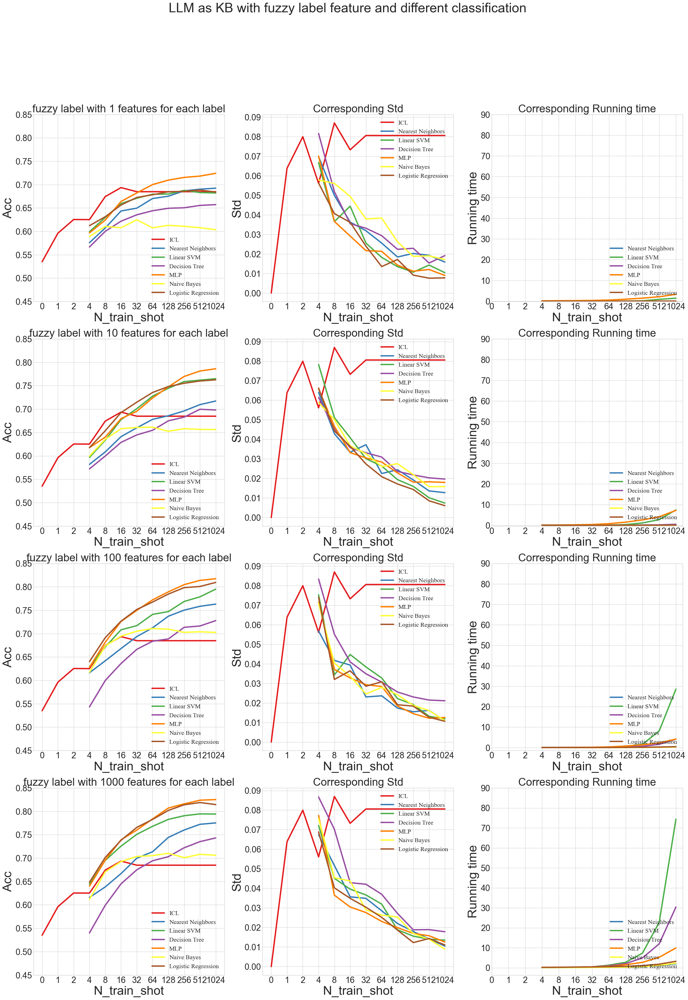

In [11]:
plt.style.use('seaborn-whitegrid')
palette = plt.get_cmap('Set1')
font1 = {'family' : 'Times New Roman',
'weight' : 'normal',
'size'   : 16,
}

fig=plt.figure(figsize=(30,40))

for index, k in enumerate(FUZZY_K):
    plt.subplot(4, 3, 3*index + 1)

    def avg_on_dataset(metrics_list):
        return np.array(metrics_list).mean(axis=0)
    avg_dicts = avg_dicts_across_k[k]
    std_dicts = std_dicts_across_k[k]
    avg_running_time = avg_running_time_across_k[k]
    avg_dict = {method: avg_on_dataset([_avgdict[method] for _avgdict in avg_dicts]) for method in method_set}
    std_dict = {method: avg_on_dataset([_stddict[method] for _stddict in std_dicts]) for method in method_set}
    running_time_dict = {method: avg_on_dataset([_timedict[method] for _timedict in avg_running_time]) for method in method_set}

    icl_avg = avg_on_dataset(icl_avgs)
    icl_std = avg_on_dataset(icl_stds)
    def draw_line(name_of_alg, color_index, avg, is_icl=False):
        if not is_icl:
            choosed_shots = fuzzy_label_shots
        else:
            choosed_shots = all_shots
        color=palette(color_index)
        plt.plot([all_shots.index(_shot) for _shot in choosed_shots], avg, color=color,label=name_of_alg,linewidth=3.5)

    draw_line('ICL',0, icl_avg, is_icl=True)
    for i, method in enumerate(method_set, start=1):
        draw_line(method,i, avg_dict[method])

    plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
    plt.yticks(np.arange(start=0.45, stop=0.9,step=0.05), fontsize=22)
    plt.xlabel('N_train_shot',fontsize=32)
    plt.ylabel('Acc',fontsize=32)
    plt.legend(loc='lower right',prop=font1)
    plt.title(f"fuzzy label with {k} features for each label", fontsize=28)


    plt.subplot(4, 3, 3*index + 2)
    draw_line('ICL',0, icl_std, is_icl=True)
    for i, method in enumerate(method_set, start=1):
        draw_line(method,i, std_dict[method])

    plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
    plt.yticks(np.arange(start=0, stop=0.1,step=0.01), fontsize=22)
    plt.xlabel('N_train_shot',fontsize=32)
    plt.ylabel('Std',fontsize=32)
    plt.legend(loc='upper right',prop=font1)
    plt.title(f"Corresponding Std", fontsize=28)

    plt.subplot(4, 3, 3*index + 3)
    for i, method in enumerate(method_set, start=1):
        draw_line(method,i, running_time_dict[method])

    plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
    plt.yticks(np.arange(start=0, stop=100,step=10), fontsize=22)
    plt.xlabel('N_train_shot',fontsize=32)
    plt.ylabel('Running time',fontsize=32)
    plt.legend(loc='lower right',prop=font1)
    plt.title(f"Corresponding Running time", fontsize=28)
plt.suptitle("LLM as KB with fuzzy label feature and different classification",fontsize=34)
plt.show()

### few-shot

C:\Users\USER\AppData\Local\Temp\ipykernel_17584\1104915398.py:115: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


[0.71302083 0.76757812 0.77747396 0.80017361] [0.09209325 0.06736633 0.06533747 0.0406964 ]
[0.54895833 0.60494792 0.65416667 0.67994792] [0.07199163 0.05897631 0.05228909 0.0441095 ]
[0.71302083 0.76757812 0.77747396 0.80017361] [0.09209325 0.06736633 0.06533747 0.0406964 ]
[0.54895833 0.60494792 0.65416667 0.67994792] [0.07199163 0.05897631 0.05228909 0.0441095 ]
[0.71302083 0.76757812 0.77747396 0.80017361] [0.09209325 0.06736633 0.06533747 0.0406964 ]
[0.54895833 0.60494792 0.65416667 0.67994792] [0.07199163 0.05897631 0.05228909 0.0441095 ]
[0.71302083 0.76757812 0.77747396 0.80017361] [0.09209325 0.06736633 0.06533747 0.0406964 ]
[0.54895833 0.60494792 0.65416667 0.67994792] [0.07199163 0.05897631 0.05228909 0.0441095 ]


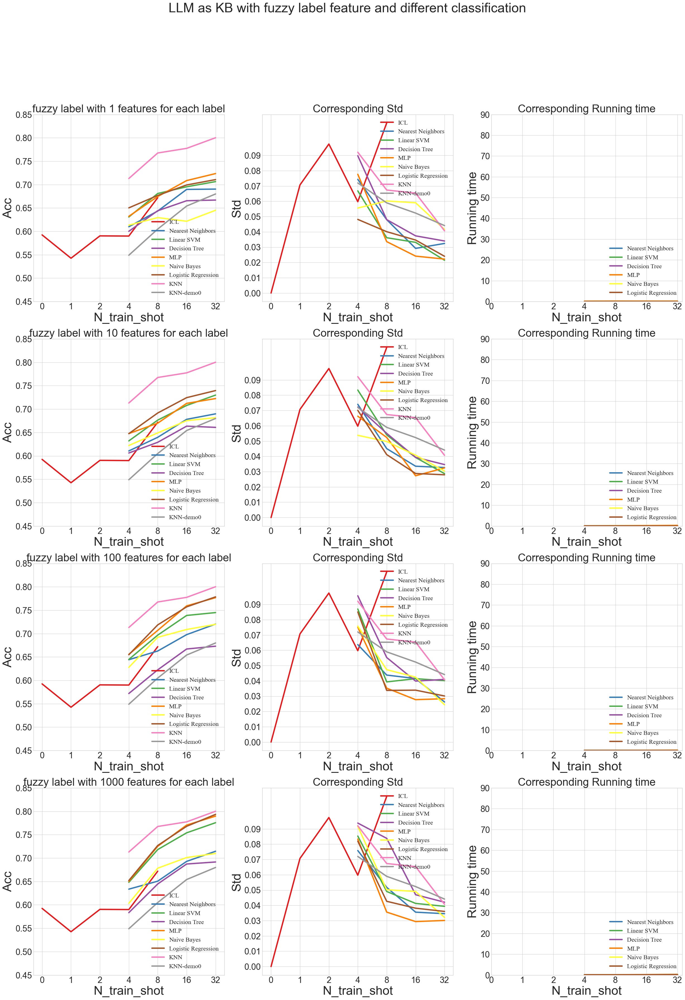

In [3]:
MODEL='gpt2-xl'
DATASETS = ['sst2', 'subj', 'mpqa', 'cr', 'mr', 'trec']
MAX_ICL_SHOTS = [16, 8, 32, 8, 8, 8]
all_shots = [0, 1, 2, 4, 8, 16, 32]
fuzzy_label_shots = [4, 8, 16, 32]
knn_train_shots = fuzzy_label_shots
FUZZY_K = [1, 10,100,1000]
# KB results
avg_dicts_across_k = {}
std_dicts_across_k = {}
avg_running_time_across_k = {}
for k in FUZZY_K:
    # if k == 1 :
    #     results = [f'../output/only_label/results_KB_only_label_feature_{dataset}.csv' for dataset in DATASETS]
    # else:
    #     results = [f'../output/fuzzy_label/results_KB_fuzzy_label_{k}_feature_{dataset}.csv' for dataset in DATASETS]
    results = [f'../output/fuzzy_label/{MODEL}/results_KB_fuzzy_label_{k}_feature_{dataset}.csv' for dataset in DATASETS]
    result_dfs = [pd.read_csv(result) for result in results]


    avg_dicts = []
    std_dicts = []
    avg_running_time = []
    # 遍历所有数据集
    for df in result_dfs:
        method_set = df['method'].unique().tolist()
        # n_train_shot_set = df['n_train_shot'].unique().tolist()
        seed_set = df['seed'].unique().tolist()

        avg_dict = {}
        std_dict = {}
        running_time_dict = {}
        for method in method_set:
            avg_dict[method] = []
            std_dict[method] = []
            running_time_dict[method] = []
            for n_train_shot in fuzzy_label_shots:
                choosed_acc = df[(df['method'] == method) & (df['n_train_shot'] == n_train_shot)]['acc']
                assert len(choosed_acc) == len(seed_set), (len(choosed_acc), len(seed_set))
                avg_dict[method].append(choosed_acc.mean())
                std_dict[method].append(choosed_acc.std())
                choosed_running_time = df[(df['method'] == method) & (df['n_train_shot'] == n_train_shot)]['running_time']
                running_time_dict[method].append(choosed_running_time.mean())
        avg_dicts.append(avg_dict)
        std_dicts.append(std_dict)
        avg_running_time.append(running_time_dict)
    avg_dicts_across_k[k] = avg_dicts
    std_dicts_across_k[k] = std_dicts
    avg_running_time_across_k[k] = avg_running_time


# icl results
icl_results = [f'../output/icl/results_icl_{dataset}.csv' for dataset in DATASETS]
icl_dfs = [pd.read_csv(icl_result) for icl_result in icl_results]

icl_avgs = []
icl_stds = []
for index, icl_df in enumerate(icl_dfs):
    # icl_n_train_shot_set = icl_df['n_train_shot'].unique().tolist()

    # assert icl_n_train_shot_set == all_shots[:len(icl_n_train_shot_set)]

    icl_avg = []
    icl_std = []
    for n_train_shot in all_shots:
        choosed_acc = icl_df[icl_df['n_train_shot'] == n_train_shot]['acc']
        icl_avg.append(choosed_acc.mean())
        icl_std.append(choosed_acc.std())

    # adjust icl result
    remain_num = len(all_shots)
    icl_avg = icl_avg + [icl_avg[- 1]]*(len(all_shots) - remain_num)
    icl_std = icl_std + [icl_std[- 1]]*(len(all_shots) - remain_num)
    icl_avgs.append(icl_avg)
    icl_stds.append(icl_std)

# KNN results
knn_results = '../output/results_knnprompting.csv'
knn_dfs = pd.read_csv(knn_results)

knn_avgs = []
knn_stds = []
for index, dataset in enumerate(DATASETS):
    knn_df = knn_dfs[knn_dfs['dataset'] == dataset]

    knn_avg = []
    knn_std = []
    for n_train_shot in fuzzy_label_shots:
        choosed_acc = knn_df[knn_df['n_train_shot'] == n_train_shot]['acc']
        knn_avg.append(choosed_acc.mean())
        knn_std.append(choosed_acc.std())

    knn_avgs.append(knn_avg)
    knn_stds.append(knn_std)

# KNN-demo0 results
knn_demo0_results = '../output/knn_demo0/results_knnprompting.csv'
knn_demo0_dfs = pd.read_csv(knn_demo0_results)

knn_demo0_avgs = []
knn_demo0_stds = []
for index, dataset in enumerate(DATASETS):
    knn_demo0_df = knn_demo0_dfs[knn_demo0_dfs['dataset'] == dataset]

    knn_avg = []
    knn_std = []
    for n_train_shot in fuzzy_label_shots:
        choosed_acc = knn_demo0_df[knn_demo0_df['n_train_shot'] == n_train_shot]['acc']
        knn_avg.append(choosed_acc.mean())
        knn_std.append(choosed_acc.std())

    knn_demo0_avgs.append(knn_avg)
    knn_demo0_stds.append(knn_std)

plt.style.use('seaborn-whitegrid')
palette = plt.get_cmap('Set1')
font1 = {'family' : 'Times New Roman',
'weight' : 'normal',
'size'   : 16,
}

fig=plt.figure(figsize=(30,40))

for index, k in enumerate(FUZZY_K):
    plt.subplot(4, 3, 3*index + 1)

    def avg_on_dataset(metrics_list):
        return np.array(metrics_list).mean(axis=0)
    avg_dicts = avg_dicts_across_k[k]
    std_dicts = std_dicts_across_k[k]
    avg_running_time = avg_running_time_across_k[k]
    avg_dict = {method: avg_on_dataset([_avgdict[method] for _avgdict in avg_dicts]) for method in method_set}
    std_dict = {method: avg_on_dataset([_stddict[method] for _stddict in std_dicts]) for method in method_set}
    running_time_dict = {method: avg_on_dataset([_timedict[method] for _timedict in avg_running_time]) for method in method_set}

    icl_avg = avg_on_dataset(icl_avgs)
    icl_std = avg_on_dataset(icl_stds)
    def draw_line(name_of_alg, color_index, avg, is_icl=False):
        if not is_icl:
            choosed_shots = fuzzy_label_shots
        else:
            choosed_shots = all_shots
        color=palette(color_index)
        plt.plot([all_shots.index(_shot) for _shot in choosed_shots], avg, color=color,label=name_of_alg,linewidth=3.5)

    draw_line('ICL',0, icl_avg, is_icl=True)
    for i, method in enumerate(method_set, start=1):
        draw_line(method,i, avg_dict[method])
        
    knn_avg = avg_on_dataset(knn_avgs)
    knn_std = avg_on_dataset(knn_stds)
    print(knn_avg, knn_std)
    color=palette(len(method_set) + 1)
    plt.plot([all_shots.index(_shot) for _shot in knn_train_shots], knn_avg, color=color,label='KNN',linewidth=3.5)

    knn_demo0_avg = avg_on_dataset(knn_demo0_avgs)
    knn_demo0_std = avg_on_dataset(knn_demo0_stds)
    print(knn_demo0_avg, knn_demo0_std)
    color=palette(len(method_set) + 2)
    plt.plot([all_shots.index(_shot) for _shot in knn_train_shots], knn_demo0_avg, color=color,label='KNN-demo0',linewidth=3.5)

    plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
    plt.yticks(np.arange(start=0.45, stop=0.9,step=0.05), fontsize=22)
    plt.xlabel('N_train_shot',fontsize=32)
    plt.ylabel('Acc',fontsize=32)
    plt.legend(loc='lower right',prop=font1)
    plt.title(f"fuzzy label with {k} features for each label", fontsize=28)


    plt.subplot(4, 3, 3*index + 2)
    draw_line('ICL',0, icl_std, is_icl=True)
    for i, method in enumerate(method_set, start=1):
        draw_line(method,i, std_dict[method])


    color=palette(len(method_set) + 1)
    plt.plot([all_shots.index(_shot) for _shot in knn_train_shots], knn_std, color=color,label='KNN',linewidth=3.5)

    color=palette(len(method_set) + 2)
    plt.plot([all_shots.index(_shot) for _shot in knn_train_shots], knn_demo0_std, color=color,label='KNN-demo0',linewidth=3.5)

    plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
    plt.yticks(np.arange(start=0, stop=0.1,step=0.01), fontsize=22)
    plt.xlabel('N_train_shot',fontsize=32)
    plt.ylabel('Std',fontsize=32)
    plt.legend(loc='upper right',prop=font1)
    plt.title(f"Corresponding Std", fontsize=28)

    plt.subplot(4, 3, 3*index + 3)
    for i, method in enumerate(method_set, start=1):
        draw_line(method,i, running_time_dict[method])

    plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
    plt.yticks(np.arange(start=0, stop=100,step=10), fontsize=22)
    plt.xlabel('N_train_shot',fontsize=32)
    plt.ylabel('Running time',fontsize=32)
    plt.legend(loc='lower right',prop=font1)
    plt.title(f"Corresponding Running time", fontsize=28)
plt.suptitle("LLM as KB with fuzzy label feature and different classification",fontsize=34)
plt.show()

### more data

C:\Users\USER\AppData\Local\Temp\ipykernel_17584\2235044987.py:115: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


[0.54864955 0.60482143 0.65414062 0.66612723 0.70090402 0.71762277
 0.73301339 0.74582589 0.75082589] [0.0661129  0.05719846 0.04803085 0.04132598 0.0265463  0.02533593
 0.02023723 0.0136014  0.01079026]
[0.54864955 0.60482143 0.65414062 0.66612723 0.70090402 0.71762277
 0.73301339 0.74582589 0.75082589] [0.0661129  0.05719846 0.04803085 0.04132598 0.0265463  0.02533593
 0.02023723 0.0136014  0.01079026]
[0.54864955 0.60482143 0.65414062 0.66612723 0.70090402 0.71762277
 0.73301339 0.74582589 0.75082589] [0.0661129  0.05719846 0.04803085 0.04132598 0.0265463  0.02533593
 0.02023723 0.0136014  0.01079026]
[0.54864955 0.60482143 0.65414062 0.66612723 0.70090402 0.71762277
 0.73301339 0.74582589 0.75082589] [0.0661129  0.05719846 0.04803085 0.04132598 0.0265463  0.02533593
 0.02023723 0.0136014  0.01079026]


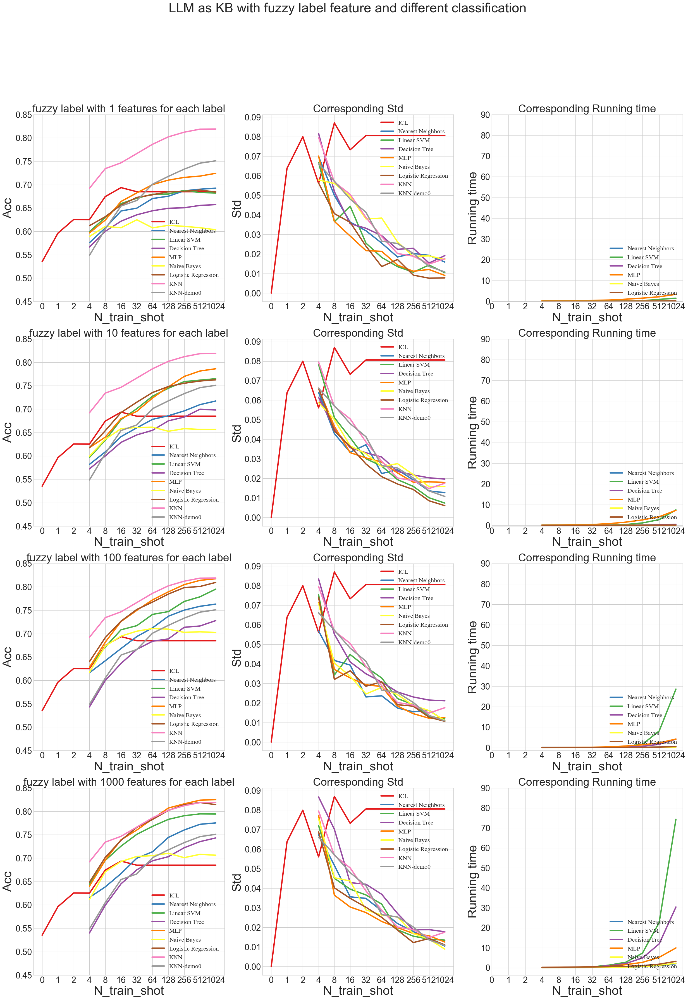

In [4]:
MODEL='gpt2-xl'
DATASETS = ['sst2', 'subj', 'mpqa', 'agnews', 'cb', 'cr', 'dbpedia', 'mr', 'rte', 'trec']
MAX_ICL_SHOTS = [16, 8, 32, 2, 2, 8, 1, 8, 4, 8]
all_shots = [0, 1, 2, 4, 8, 16, 32, 64, 128, 256, 512, 1024]
fuzzy_label_shots = [4, 8, 16, 32, 64, 128, 256, 512, 1024]
knn_train_shots = [4, 8, 16, 32, 64, 128, 256, 512, 1024]
FUZZY_K = [1, 10,100,1000]
# KB results
avg_dicts_across_k = {}
std_dicts_across_k = {}
avg_running_time_across_k = {}
for k in FUZZY_K:
    # if k == 1 :
    #     results = [f'../output/only_label/results_KB_only_label_feature_{dataset}.csv' for dataset in DATASETS]
    # else:
    #     results = [f'../output/fuzzy_label/results_KB_fuzzy_label_{k}_feature_{dataset}.csv' for dataset in DATASETS]
    results = [f'../output/fuzzy_label/{MODEL}/results_KB_fuzzy_label_{k}_feature_{dataset}.csv' for dataset in DATASETS]
    result_dfs = [pd.read_csv(result) for result in results]


    avg_dicts = []
    std_dicts = []
    avg_running_time = []
    # 遍历所有数据集
    for df in result_dfs:
        method_set = df['method'].unique().tolist()
        # n_train_shot_set = df['n_train_shot'].unique().tolist()
        seed_set = df['seed'].unique().tolist()

        avg_dict = {}
        std_dict = {}
        running_time_dict = {}
        for method in method_set:
            avg_dict[method] = []
            std_dict[method] = []
            running_time_dict[method] = []
            for n_train_shot in fuzzy_label_shots:
                choosed_acc = df[(df['method'] == method) & (df['n_train_shot'] == n_train_shot)]['acc']
                assert len(choosed_acc) == len(seed_set), (len(choosed_acc), len(seed_set))
                avg_dict[method].append(choosed_acc.mean())
                std_dict[method].append(choosed_acc.std())
                choosed_running_time = df[(df['method'] == method) & (df['n_train_shot'] == n_train_shot)]['running_time']
                running_time_dict[method].append(choosed_running_time.mean())
        avg_dicts.append(avg_dict)
        std_dicts.append(std_dict)
        avg_running_time.append(running_time_dict)
    avg_dicts_across_k[k] = avg_dicts
    std_dicts_across_k[k] = std_dicts
    avg_running_time_across_k[k] = avg_running_time


# icl results
icl_results = [f'../output/icl/results_icl_{dataset}.csv' for dataset in DATASETS]
icl_dfs = [pd.read_csv(icl_result) for icl_result in icl_results]

icl_avgs = []
icl_stds = []
for index, icl_df in enumerate(icl_dfs):
    # icl_n_train_shot_set = icl_df['n_train_shot'].unique().tolist()

    # assert icl_n_train_shot_set == all_shots[:len(icl_n_train_shot_set)]

    icl_avg = []
    icl_std = []
    for n_train_shot in sorted(icl_df['n_train_shot'].unique().tolist()):
        choosed_acc = icl_df[icl_df['n_train_shot'] == n_train_shot]['acc']
        icl_avg.append(choosed_acc.mean())
        icl_std.append(choosed_acc.std())

    # adjust icl result
    remain_num = len(icl_avg)
    icl_avg = icl_avg + [icl_avg[- 1]]*(len(all_shots) - remain_num)
    icl_std = icl_std + [icl_std[- 1]]*(len(all_shots) - remain_num)
    icl_avgs.append(icl_avg)
    icl_stds.append(icl_std)

# KNN results
knn_results = '../output/results_knnprompting.csv'
knn_dfs = pd.read_csv(knn_results)

knn_avgs = []
knn_stds = []
for index, dataset in enumerate(DATASETS):
    knn_df = knn_dfs[knn_dfs['dataset'] == dataset]

    knn_avg = []
    knn_std = []
    for n_train_shot in knn_train_shots:
        choosed_acc = knn_df[knn_df['n_train_shot'] == n_train_shot]['acc']
        knn_avg.append(choosed_acc.mean())
        knn_std.append(choosed_acc.std())

    knn_avgs.append(knn_avg)
    knn_stds.append(knn_std)

# KNN-demo0 results
knn_demo0_results = '../output/knn_demo0/results_knnprompting.csv'
knn_demo0_dfs = pd.read_csv(knn_demo0_results)

knn_demo0_avgs = []
knn_demo0_stds = []
for index, dataset in enumerate(DATASETS):
    knn_demo0_df = knn_demo0_dfs[knn_demo0_dfs['dataset'] == dataset]

    knn_avg = []
    knn_std = []
    for n_train_shot in fuzzy_label_shots:
        choosed_acc = knn_demo0_df[knn_demo0_df['n_train_shot'] == n_train_shot]['acc']
        knn_avg.append(choosed_acc.mean())
        knn_std.append(choosed_acc.std())

    knn_demo0_avgs.append(knn_avg)
    knn_demo0_stds.append(knn_std)

plt.style.use('seaborn-whitegrid')
palette = plt.get_cmap('Set1')
font1 = {'family' : 'Times New Roman',
'weight' : 'normal',
'size'   : 16,
}

fig=plt.figure(figsize=(30,40))

for index, k in enumerate(FUZZY_K):
    plt.subplot(4, 3, 3*index + 1)

    def avg_on_dataset(metrics_list):
        return np.array(metrics_list).mean(axis=0)
    avg_dicts = avg_dicts_across_k[k]
    std_dicts = std_dicts_across_k[k]
    avg_running_time = avg_running_time_across_k[k]
    avg_dict = {method: avg_on_dataset([_avgdict[method] for _avgdict in avg_dicts]) for method in method_set}
    std_dict = {method: avg_on_dataset([_stddict[method] for _stddict in std_dicts]) for method in method_set}
    running_time_dict = {method: avg_on_dataset([_timedict[method] for _timedict in avg_running_time]) for method in method_set}

    icl_avg = avg_on_dataset(icl_avgs)
    icl_std = avg_on_dataset(icl_stds)
    def draw_line(name_of_alg, color_index, avg, is_icl=False):
        if not is_icl:
            choosed_shots = fuzzy_label_shots
        else:
            choosed_shots = all_shots
        color=palette(color_index)
        plt.plot([all_shots.index(_shot) for _shot in choosed_shots], avg, color=color,label=name_of_alg,linewidth=3.5)

    draw_line('ICL',0, icl_avg, is_icl=True)
    for i, method in enumerate(method_set, start=1):
        draw_line(method,i, avg_dict[method])
    
    knn_avg = avg_on_dataset(knn_avgs)
    knn_std = avg_on_dataset(knn_stds)
    color=palette(len(method_set) + 1)
    plt.plot([all_shots.index(_shot) for _shot in knn_train_shots], knn_avg, color=color,label='KNN',linewidth=3.5)

    knn_demo0_avg = avg_on_dataset(knn_demo0_avgs)
    knn_demo0_std = avg_on_dataset(knn_demo0_stds)
    print(knn_demo0_avg, knn_demo0_std)
    color=palette(len(method_set) + 2)
    plt.plot([all_shots.index(_shot) for _shot in knn_train_shots], knn_demo0_avg, color=color,label='KNN-demo0',linewidth=3.5)


    plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
    plt.yticks(np.arange(start=0.45, stop=0.9,step=0.05), fontsize=22)
    plt.xlabel('N_train_shot',fontsize=32)
    plt.ylabel('Acc',fontsize=32)
    plt.legend(loc='lower right',prop=font1)
    plt.title(f"fuzzy label with {k} features for each label", fontsize=28)


    plt.subplot(4, 3, 3*index + 2)
    draw_line('ICL',0, icl_std, is_icl=True)
    for i, method in enumerate(method_set, start=1):
        draw_line(method,i, std_dict[method])
    
    color=palette(len(method_set) + 1)
    plt.plot([all_shots.index(_shot) for _shot in knn_train_shots], knn_std, color=color,label='KNN',linewidth=3.5)

    color=palette(len(method_set) + 2)
    plt.plot([all_shots.index(_shot) for _shot in knn_train_shots], knn_demo0_std, color=color,label='KNN-demo0',linewidth=3.5)


    plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
    plt.yticks(np.arange(start=0, stop=0.1,step=0.01), fontsize=22)
    plt.xlabel('N_train_shot',fontsize=32)
    plt.ylabel('Std',fontsize=32)
    plt.legend(loc='upper right',prop=font1)
    plt.title(f"Corresponding Std", fontsize=28)

    plt.subplot(4, 3, 3*index + 3)
    for i, method in enumerate(method_set, start=1):
        draw_line(method,i, running_time_dict[method])

    plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
    plt.yticks(np.arange(start=0, stop=100,step=10), fontsize=22)
    plt.xlabel('N_train_shot',fontsize=32)
    plt.ylabel('Running time',fontsize=32)
    plt.legend(loc='lower right',prop=font1)
    plt.title(f"Corresponding Running time", fontsize=28)
plt.suptitle("LLM as KB with fuzzy label feature and different classification",fontsize=34)
plt.show()

C:\Users\USER\AppData\Local\Temp\ipykernel_16604\2571236696.py:115: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


[0.54864955 0.60482143 0.65414062 0.66612723 0.70090402 0.71762277
 0.73301339 0.74582589 0.75082589] [0.0661129  0.05719846 0.04803085 0.04132598 0.0265463  0.02533593
 0.02023723 0.0136014  0.01079026]
[0.54864955 0.60482143 0.65414062 0.66612723 0.70090402 0.71762277
 0.73301339 0.74582589 0.75082589] [0.0661129  0.05719846 0.04803085 0.04132598 0.0265463  0.02533593
 0.02023723 0.0136014  0.01079026]
[0.54864955 0.60482143 0.65414062 0.66612723 0.70090402 0.71762277
 0.73301339 0.74582589 0.75082589] [0.0661129  0.05719846 0.04803085 0.04132598 0.0265463  0.02533593
 0.02023723 0.0136014  0.01079026]
[0.54864955 0.60482143 0.65414062 0.66612723 0.70090402 0.71762277
 0.73301339 0.74582589 0.75082589] [0.0661129  0.05719846 0.04803085 0.04132598 0.0265463  0.02533593
 0.02023723 0.0136014  0.01079026]


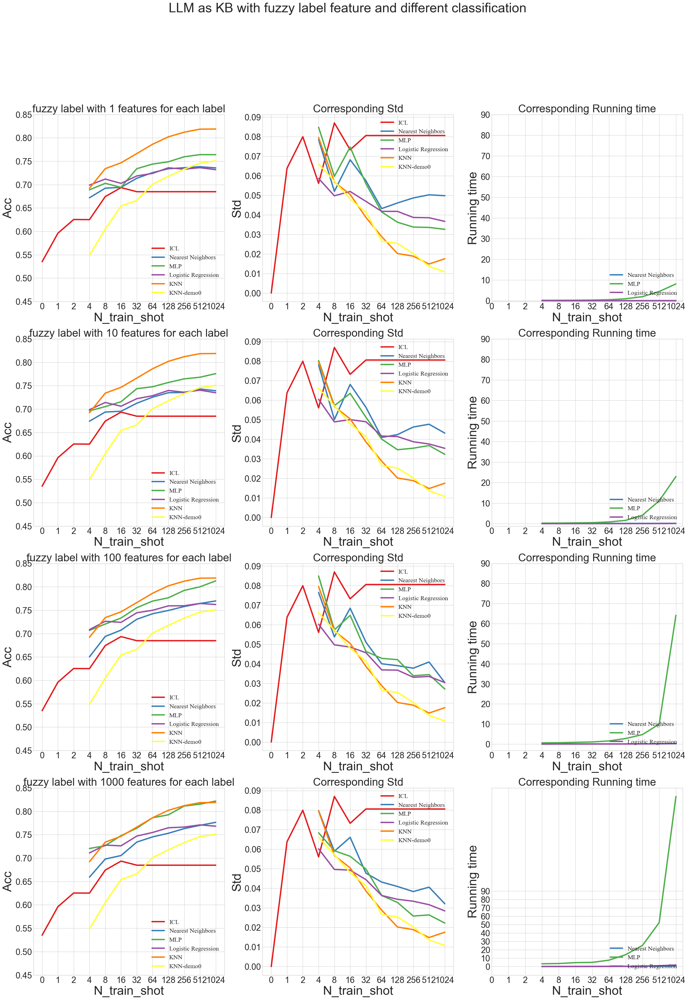

In [3]:
MODEL='gpt2-xl'
DATASETS = ['sst2', 'subj', 'mpqa', 'agnews', 'cb', 'cr', 'dbpedia', 'mr', 'rte', 'trec']
MAX_ICL_SHOTS = [16, 8, 32, 2, 2, 8, 1, 8, 4, 8]
all_shots = [0, 1, 2, 4, 8, 16, 32, 64, 128, 256, 512, 1024]
fuzzy_label_shots = [4, 8, 16, 32, 64, 128, 256, 512, 1024]
knn_train_shots = [4, 8, 16, 32, 64, 128, 256, 512, 1024]
FUZZY_K = [1, 10,100,1000]
# KB results
avg_dicts_across_k = {}
std_dicts_across_k = {}
avg_running_time_across_k = {}
for k in FUZZY_K:
    # if k == 1 :
    #     results = [f'../output/only_label/results_KB_only_label_feature_{dataset}.csv' for dataset in DATASETS]
    # else:
    #     results = [f'../output/fuzzy_label/results_KB_fuzzy_label_{k}_feature_{dataset}.csv' for dataset in DATASETS]
    results = [f'../output/probs_fuzzy_with_demo/{MODEL}/results_KB_fuzzy_label_{k}_feature_{dataset}.csv' for dataset in DATASETS]
    result_dfs = [pd.read_csv(result) for result in results]


    avg_dicts = []
    std_dicts = []
    avg_running_time = []
    # 遍历所有数据集
    for df in result_dfs:
        method_set = df['method'].unique().tolist()
        # n_train_shot_set = df['n_train_shot'].unique().tolist()
        seed_set = df['seed'].unique().tolist()

        avg_dict = {}
        std_dict = {}
        running_time_dict = {}
        for method in method_set:
            avg_dict[method] = []
            std_dict[method] = []
            running_time_dict[method] = []
            for n_train_shot in fuzzy_label_shots:
                choosed_acc = df[(df['method'] == method) & (df['n_train_shot'] == n_train_shot)]['acc']
                assert len(choosed_acc) == len(seed_set), (len(choosed_acc), len(seed_set))
                avg_dict[method].append(choosed_acc.mean())
                std_dict[method].append(choosed_acc.std())
                choosed_running_time = df[(df['method'] == method) & (df['n_train_shot'] == n_train_shot)]['running_time']
                running_time_dict[method].append(choosed_running_time.mean())
        avg_dicts.append(avg_dict)
        std_dicts.append(std_dict)
        avg_running_time.append(running_time_dict)
    avg_dicts_across_k[k] = avg_dicts
    std_dicts_across_k[k] = std_dicts
    avg_running_time_across_k[k] = avg_running_time


# icl results
icl_results = [f'../output/icl/results_icl_{dataset}.csv' for dataset in DATASETS]
icl_dfs = [pd.read_csv(icl_result) for icl_result in icl_results]

icl_avgs = []
icl_stds = []
for index, icl_df in enumerate(icl_dfs):
    # icl_n_train_shot_set = icl_df['n_train_shot'].unique().tolist()

    # assert icl_n_train_shot_set == all_shots[:len(icl_n_train_shot_set)]

    icl_avg = []
    icl_std = []
    for n_train_shot in sorted(icl_df['n_train_shot'].unique().tolist()):
        choosed_acc = icl_df[icl_df['n_train_shot'] == n_train_shot]['acc']
        icl_avg.append(choosed_acc.mean())
        icl_std.append(choosed_acc.std())

    # adjust icl result
    remain_num = len(icl_avg)
    icl_avg = icl_avg + [icl_avg[- 1]]*(len(all_shots) - remain_num)
    icl_std = icl_std + [icl_std[- 1]]*(len(all_shots) - remain_num)
    icl_avgs.append(icl_avg)
    icl_stds.append(icl_std)

# KNN results
knn_results = '../output/results_knnprompting.csv'
knn_dfs = pd.read_csv(knn_results)

knn_avgs = []
knn_stds = []
for index, dataset in enumerate(DATASETS):
    knn_df = knn_dfs[knn_dfs['dataset'] == dataset]

    knn_avg = []
    knn_std = []
    for n_train_shot in knn_train_shots:
        choosed_acc = knn_df[knn_df['n_train_shot'] == n_train_shot]['acc']
        knn_avg.append(choosed_acc.mean())
        knn_std.append(choosed_acc.std())

    knn_avgs.append(knn_avg)
    knn_stds.append(knn_std)

# KNN-demo0 results
knn_demo0_results = '../output/knn_demo0/results_knnprompting.csv'
knn_demo0_dfs = pd.read_csv(knn_demo0_results)

knn_demo0_avgs = []
knn_demo0_stds = []
for index, dataset in enumerate(DATASETS):
    knn_demo0_df = knn_demo0_dfs[knn_demo0_dfs['dataset'] == dataset]

    knn_avg = []
    knn_std = []
    for n_train_shot in fuzzy_label_shots:
        choosed_acc = knn_demo0_df[knn_demo0_df['n_train_shot'] == n_train_shot]['acc']
        knn_avg.append(choosed_acc.mean())
        knn_std.append(choosed_acc.std())

    knn_demo0_avgs.append(knn_avg)
    knn_demo0_stds.append(knn_std)

plt.style.use('seaborn-whitegrid')
palette = plt.get_cmap('Set1')
font1 = {'family' : 'Times New Roman',
'weight' : 'normal',
'size'   : 16,
}

fig=plt.figure(figsize=(30,40))

for index, k in enumerate(FUZZY_K):
    plt.subplot(4, 3, 3*index + 1)

    def avg_on_dataset(metrics_list):
        return np.array(metrics_list).mean(axis=0)
    avg_dicts = avg_dicts_across_k[k]
    std_dicts = std_dicts_across_k[k]
    avg_running_time = avg_running_time_across_k[k]
    avg_dict = {method: avg_on_dataset([_avgdict[method] for _avgdict in avg_dicts]) for method in method_set}
    std_dict = {method: avg_on_dataset([_stddict[method] for _stddict in std_dicts]) for method in method_set}
    running_time_dict = {method: avg_on_dataset([_timedict[method] for _timedict in avg_running_time]) for method in method_set}

    icl_avg = avg_on_dataset(icl_avgs)
    icl_std = avg_on_dataset(icl_stds)
    def draw_line(name_of_alg, color_index, avg, is_icl=False):
        if not is_icl:
            choosed_shots = fuzzy_label_shots
        else:
            choosed_shots = all_shots
        color=palette(color_index)
        plt.plot([all_shots.index(_shot) for _shot in choosed_shots], avg, color=color,label=name_of_alg,linewidth=3.5)

    draw_line('ICL',0, icl_avg, is_icl=True)
    for i, method in enumerate(method_set, start=1):
        draw_line(method,i, avg_dict[method])
    
    knn_avg = avg_on_dataset(knn_avgs)
    knn_std = avg_on_dataset(knn_stds)
    color=palette(len(method_set) + 1)
    plt.plot([all_shots.index(_shot) for _shot in knn_train_shots], knn_avg, color=color,label='KNN',linewidth=3.5)

    knn_demo0_avg = avg_on_dataset(knn_demo0_avgs)
    knn_demo0_std = avg_on_dataset(knn_demo0_stds)
    print(knn_demo0_avg, knn_demo0_std)
    color=palette(len(method_set) + 2)
    plt.plot([all_shots.index(_shot) for _shot in knn_train_shots], knn_demo0_avg, color=color,label='KNN-demo0',linewidth=3.5)


    plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
    plt.yticks(np.arange(start=0.45, stop=0.9,step=0.05), fontsize=22)
    plt.xlabel('N_train_shot',fontsize=32)
    plt.ylabel('Acc',fontsize=32)
    plt.legend(loc='lower right',prop=font1)
    plt.title(f"fuzzy label with {k} features for each label", fontsize=28)


    plt.subplot(4, 3, 3*index + 2)
    draw_line('ICL',0, icl_std, is_icl=True)
    for i, method in enumerate(method_set, start=1):
        draw_line(method,i, std_dict[method])
    
    color=palette(len(method_set) + 1)
    plt.plot([all_shots.index(_shot) for _shot in knn_train_shots], knn_std, color=color,label='KNN',linewidth=3.5)

    color=palette(len(method_set) + 2)
    plt.plot([all_shots.index(_shot) for _shot in knn_train_shots], knn_demo0_std, color=color,label='KNN-demo0',linewidth=3.5)


    plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
    plt.yticks(np.arange(start=0, stop=0.1,step=0.01), fontsize=22)
    plt.xlabel('N_train_shot',fontsize=32)
    plt.ylabel('Std',fontsize=32)
    plt.legend(loc='upper right',prop=font1)
    plt.title(f"Corresponding Std", fontsize=28)

    plt.subplot(4, 3, 3*index + 3)
    for i, method in enumerate(method_set, start=1):
        draw_line(method,i, running_time_dict[method])

    plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
    plt.yticks(np.arange(start=0, stop=100,step=10), fontsize=22)
    plt.xlabel('N_train_shot',fontsize=32)
    plt.ylabel('Running time',fontsize=32)
    plt.legend(loc='lower right',prop=font1)
    plt.title(f"Corresponding Running time", fontsize=28)
plt.suptitle("LLM as KB with fuzzy label feature and different classification",fontsize=34)
plt.show()

### no stardardscaler

C:\Users\USER\AppData\Local\Temp\ipykernel_17584\2354738102.py:115: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


[0.54864955 0.60482143 0.65414062 0.66612723 0.70090402 0.71762277
 0.73301339 0.74582589 0.75082589] [0.0661129  0.05719846 0.04803085 0.04132598 0.0265463  0.02533593
 0.02023723 0.0136014  0.01079026]
[0.54864955 0.60482143 0.65414062 0.66612723 0.70090402 0.71762277
 0.73301339 0.74582589 0.75082589] [0.0661129  0.05719846 0.04803085 0.04132598 0.0265463  0.02533593
 0.02023723 0.0136014  0.01079026]
[0.54864955 0.60482143 0.65414062 0.66612723 0.70090402 0.71762277
 0.73301339 0.74582589 0.75082589] [0.0661129  0.05719846 0.04803085 0.04132598 0.0265463  0.02533593
 0.02023723 0.0136014  0.01079026]
[0.54864955 0.60482143 0.65414062 0.66612723 0.70090402 0.71762277
 0.73301339 0.74582589 0.75082589] [0.0661129  0.05719846 0.04803085 0.04132598 0.0265463  0.02533593
 0.02023723 0.0136014  0.01079026]


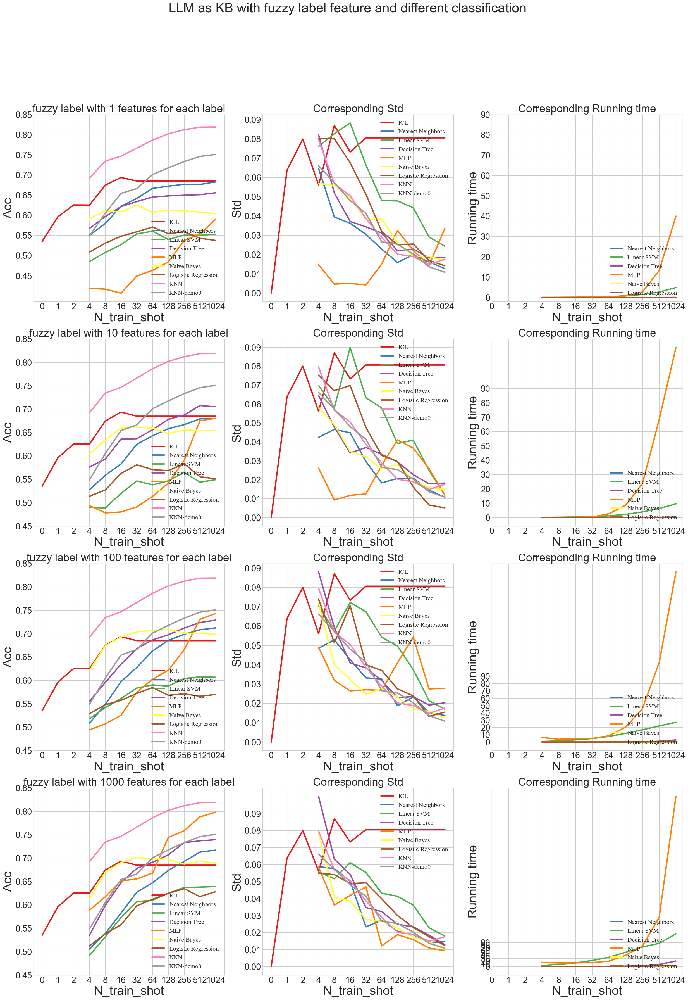

In [10]:
MODEL='gpt2-xl'
DATASETS = ['sst2', 'subj', 'mpqa', 'agnews', 'cb', 'cr', 'dbpedia', 'mr', 'rte', 'trec']
MAX_ICL_SHOTS = [16, 8, 32, 2, 2, 8, 1, 8, 4, 8]
all_shots = [0, 1, 2, 4, 8, 16, 32, 64, 128, 256, 512, 1024]
fuzzy_label_shots = [4, 8, 16, 32, 64, 128, 256, 512, 1024]
knn_train_shots = [4, 8, 16, 32, 64, 128, 256, 512, 1024]
FUZZY_K = [1, 10,100,1000]
# KB results
avg_dicts_across_k = {}
std_dicts_across_k = {}
avg_running_time_across_k = {}
for k in FUZZY_K:
    # if k == 1 :
    #     results = [f'../output/only_label/results_KB_only_label_feature_{dataset}.csv' for dataset in DATASETS]
    # else:
    #     results = [f'../output/fuzzy_label/results_KB_fuzzy_label_{k}_feature_{dataset}.csv' for dataset in DATASETS]
    results = [f'../output/fuzzy_label_no_StandardScaler/{MODEL}/results_KB_fuzzy_label_{k}_feature_{dataset}.csv' for dataset in DATASETS]
    result_dfs = [pd.read_csv(result) for result in results]


    avg_dicts = []
    std_dicts = []
    avg_running_time = []
    # 遍历所有数据集
    for df in result_dfs:
        method_set = df['method'].unique().tolist()
        # n_train_shot_set = df['n_train_shot'].unique().tolist()
        seed_set = df['seed'].unique().tolist()

        avg_dict = {}
        std_dict = {}
        running_time_dict = {}
        for method in method_set:
            avg_dict[method] = []
            std_dict[method] = []
            running_time_dict[method] = []
            for n_train_shot in fuzzy_label_shots:
                choosed_acc = df[(df['method'] == method) & (df['n_train_shot'] == n_train_shot)]['acc']
                assert len(choosed_acc) == len(seed_set), (len(choosed_acc), len(seed_set))
                avg_dict[method].append(choosed_acc.mean())
                std_dict[method].append(choosed_acc.std())
                choosed_running_time = df[(df['method'] == method) & (df['n_train_shot'] == n_train_shot)]['running_time']
                running_time_dict[method].append(choosed_running_time.mean())
        avg_dicts.append(avg_dict)
        std_dicts.append(std_dict)
        avg_running_time.append(running_time_dict)
    avg_dicts_across_k[k] = avg_dicts
    std_dicts_across_k[k] = std_dicts
    avg_running_time_across_k[k] = avg_running_time


# icl results
icl_results = [f'../output/icl/results_icl_{dataset}.csv' for dataset in DATASETS]
icl_dfs = [pd.read_csv(icl_result) for icl_result in icl_results]

icl_avgs = []
icl_stds = []
for index, icl_df in enumerate(icl_dfs):
    # icl_n_train_shot_set = icl_df['n_train_shot'].unique().tolist()

    # assert icl_n_train_shot_set == all_shots[:len(icl_n_train_shot_set)]

    icl_avg = []
    icl_std = []
    for n_train_shot in sorted(icl_df['n_train_shot'].unique().tolist()):
        choosed_acc = icl_df[icl_df['n_train_shot'] == n_train_shot]['acc']
        icl_avg.append(choosed_acc.mean())
        icl_std.append(choosed_acc.std())

    # adjust icl result
    remain_num = len(icl_avg)
    icl_avg = icl_avg + [icl_avg[- 1]]*(len(all_shots) - remain_num)
    icl_std = icl_std + [icl_std[- 1]]*(len(all_shots) - remain_num)
    icl_avgs.append(icl_avg)
    icl_stds.append(icl_std)

# KNN results
knn_results = '../output/results_knnprompting.csv'
knn_dfs = pd.read_csv(knn_results)

knn_avgs = []
knn_stds = []
for index, dataset in enumerate(DATASETS):
    knn_df = knn_dfs[knn_dfs['dataset'] == dataset]

    knn_avg = []
    knn_std = []
    for n_train_shot in knn_train_shots:
        choosed_acc = knn_df[knn_df['n_train_shot'] == n_train_shot]['acc']
        knn_avg.append(choosed_acc.mean())
        knn_std.append(choosed_acc.std())

    knn_avgs.append(knn_avg)
    knn_stds.append(knn_std)

# KNN-demo0 results
knn_demo0_results = '../output/knn_demo0/results_knnprompting.csv'
knn_demo0_dfs = pd.read_csv(knn_demo0_results)

knn_demo0_avgs = []
knn_demo0_stds = []
for index, dataset in enumerate(DATASETS):
    knn_demo0_df = knn_demo0_dfs[knn_demo0_dfs['dataset'] == dataset]

    knn_avg = []
    knn_std = []
    for n_train_shot in fuzzy_label_shots:
        choosed_acc = knn_demo0_df[knn_demo0_df['n_train_shot'] == n_train_shot]['acc']
        knn_avg.append(choosed_acc.mean())
        knn_std.append(choosed_acc.std())

    knn_demo0_avgs.append(knn_avg)
    knn_demo0_stds.append(knn_std)

plt.style.use('seaborn-whitegrid')
palette = plt.get_cmap('Set1')
font1 = {'family' : 'Times New Roman',
'weight' : 'normal',
'size'   : 16,
}

fig=plt.figure(figsize=(30,40))

for index, k in enumerate(FUZZY_K):
    plt.subplot(4, 3, 3*index + 1)

    def avg_on_dataset(metrics_list):
        return np.array(metrics_list).mean(axis=0)
    avg_dicts = avg_dicts_across_k[k]
    std_dicts = std_dicts_across_k[k]
    avg_running_time = avg_running_time_across_k[k]
    avg_dict = {method: avg_on_dataset([_avgdict[method] for _avgdict in avg_dicts]) for method in method_set}
    std_dict = {method: avg_on_dataset([_stddict[method] for _stddict in std_dicts]) for method in method_set}
    running_time_dict = {method: avg_on_dataset([_timedict[method] for _timedict in avg_running_time]) for method in method_set}

    icl_avg = avg_on_dataset(icl_avgs)
    icl_std = avg_on_dataset(icl_stds)
    def draw_line(name_of_alg, color_index, avg, is_icl=False):
        if not is_icl:
            choosed_shots = fuzzy_label_shots
        else:
            choosed_shots = all_shots
        color=palette(color_index)
        plt.plot([all_shots.index(_shot) for _shot in choosed_shots], avg, color=color,label=name_of_alg,linewidth=3.5)

    draw_line('ICL',0, icl_avg, is_icl=True)
    for i, method in enumerate(method_set, start=1):
        draw_line(method,i, avg_dict[method])
    
    knn_avg = avg_on_dataset(knn_avgs)
    knn_std = avg_on_dataset(knn_stds)
    color=palette(len(method_set) + 1)
    plt.plot([all_shots.index(_shot) for _shot in knn_train_shots], knn_avg, color=color,label='KNN',linewidth=3.5)

    knn_demo0_avg = avg_on_dataset(knn_demo0_avgs)
    knn_demo0_std = avg_on_dataset(knn_demo0_stds)
    print(knn_demo0_avg, knn_demo0_std)
    color=palette(len(method_set) + 2)
    plt.plot([all_shots.index(_shot) for _shot in knn_train_shots], knn_demo0_avg, color=color,label='KNN-demo0',linewidth=3.5)


    plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
    plt.yticks(np.arange(start=0.45, stop=0.9,step=0.05), fontsize=22)
    plt.xlabel('N_train_shot',fontsize=32)
    plt.ylabel('Acc',fontsize=32)
    plt.legend(loc='lower right',prop=font1)
    plt.title(f"fuzzy label with {k} features for each label", fontsize=28)


    plt.subplot(4, 3, 3*index + 2)
    draw_line('ICL',0, icl_std, is_icl=True)
    for i, method in enumerate(method_set, start=1):
        draw_line(method,i, std_dict[method])
    
    color=palette(len(method_set) + 1)
    plt.plot([all_shots.index(_shot) for _shot in knn_train_shots], knn_std, color=color,label='KNN',linewidth=3.5)

    color=palette(len(method_set) + 2)
    plt.plot([all_shots.index(_shot) for _shot in knn_train_shots], knn_demo0_std, color=color,label='KNN-demo0',linewidth=3.5)


    plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
    plt.yticks(np.arange(start=0, stop=0.1,step=0.01), fontsize=22)
    plt.xlabel('N_train_shot',fontsize=32)
    plt.ylabel('Std',fontsize=32)
    plt.legend(loc='upper right',prop=font1)
    plt.title(f"Corresponding Std", fontsize=28)

    plt.subplot(4, 3, 3*index + 3)
    for i, method in enumerate(method_set, start=1):
        draw_line(method,i, running_time_dict[method])

    plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
    plt.yticks(np.arange(start=0, stop=100,step=10), fontsize=22)
    plt.xlabel('N_train_shot',fontsize=32)
    plt.ylabel('Running time',fontsize=32)
    plt.legend(loc='lower right',prop=font1)
    plt.title(f"Corresponding Running time", fontsize=28)
plt.suptitle("LLM as KB with fuzzy label feature and different classification",fontsize=34)
plt.show()

### for every dataset

C:\Users\USER\AppData\Local\Temp\ipykernel_16604\1397650890.py:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


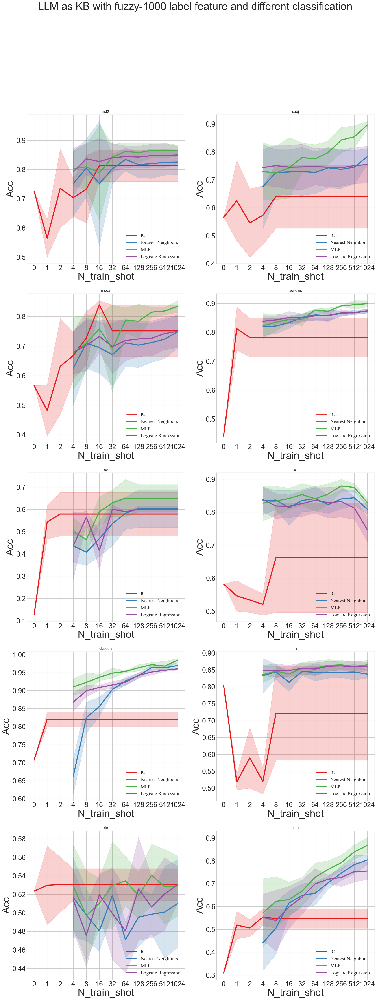

In [4]:
plt.style.use('seaborn-whitegrid')
palette = plt.get_cmap('Set1')
font1 = {'family' : 'Times New Roman',
'weight' : 'normal',
'size'   : 16,
}

fig=plt.figure(figsize=(20,50))


def avg_on_dataset(metrics_list):
    return np.array(metrics_list).mean(axis=0)

k=1000
avg_dicts = avg_dicts_across_k[k]
std_dicts = std_dicts_across_k[k]

for index, dataset in enumerate(DATASETS):
    plt.subplot(5, 2, index + 1)
    
    avg_dict = avg_dicts[index]
    std_dict = std_dicts[index]
    icl_avg = icl_avgs[index]
    icl_std = icl_stds[index]
    def draw_line(name_of_alg, color_index, avg, std, is_icl=False):
        if not is_icl:
            choosed_shots = fuzzy_label_shots
        else:
            choosed_shots = all_shots
        color=palette(color_index)
        r1 = list(map(lambda x: x[0]-x[1], zip(avg, std)))#上方差
        r2 = list(map(lambda x: x[0]+x[1], zip(avg, std)))#下方差
        plt.plot([all_shots.index(_shot) for _shot in choosed_shots], avg, color=color,label=name_of_alg,linewidth=3.5)
        plt.fill_between([all_shots.index(_shot) for _shot in choosed_shots], r1, r2, color=color, alpha=0.2)

    draw_line('ICL',0, icl_avg, icl_std, is_icl=True)
    for i, method in enumerate(method_set, start=1):
        draw_line(method,i, avg_dict[method], std_dict[method])

    plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
    plt.yticks(fontsize=22)
    plt.xlabel('N_train_shot',fontsize=32)
    plt.ylabel('Acc',fontsize=32)
    plt.legend(loc='lower right',prop=font1)
    plt.title(f"{dataset}")
plt.suptitle(f"LLM as KB with fuzzy-{k} label feature and different classification",fontsize=34)
plt.show()

### all-dim feature

/tmp/ipykernel_629839/1410055784.py:82: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


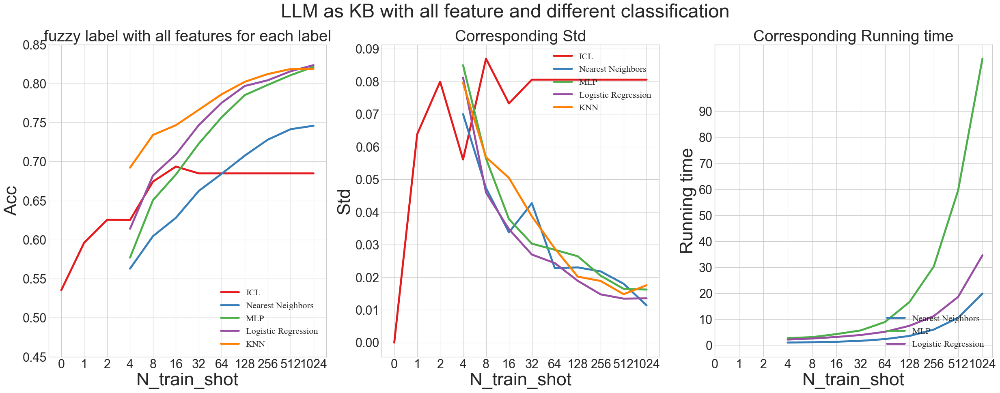

In [8]:
MODEL='gpt2-xl'
DATASETS = ['sst2', 'subj', 'mpqa', 'agnews', 'cb', 'cr', 'dbpedia', 'mr', 'rte', 'trec']
MAX_ICL_SHOTS = [16, 8, 32, 2, 2, 8, 1, 8, 4, 8]
all_shots = [0, 1, 2, 4, 8, 16, 32, 64, 128, 256, 512, 1024]
fuzzy_label_shots = [4, 8, 16, 32, 64, 128, 256, 512, 1024]
# KB results
results = [f'../output/all/{MODEL}/results_KB_all_feature_{dataset}.csv' for dataset in DATASETS]
result_dfs = [pd.read_csv(result) for result in results]


avg_dicts = []
std_dicts = []
avg_running_time = []
for df in result_dfs:
    method_set = df['method'].unique().tolist()
    n_train_shot_set = df['n_train_shot'].unique().tolist()
    seed_set = df['seed'].unique().tolist()

    assert n_train_shot_set == fuzzy_label_shots

    avg_dict = {}
    std_dict = {}
    running_time_dict = {}
    for method in method_set:
        avg_dict[method] = []
        std_dict[method] = []
        running_time_dict[method] = []
        for n_train_shot in n_train_shot_set:
            choosed_acc = df[(df['method'] == method) & (df['n_train_shot'] == n_train_shot)]['acc']
            avg_dict[method].append(choosed_acc.mean())
            std_dict[method].append(choosed_acc.std())
            choosed_running_time = df[(df['method'] == method) & (df['n_train_shot'] == n_train_shot)]['running_time']
            running_time_dict[method].append(choosed_running_time.mean())
    avg_dicts.append(avg_dict)
    std_dicts.append(std_dict)
    avg_running_time.append(running_time_dict)

# icl results
icl_results = [f'../output/icl/results_icl_{dataset}.csv' for dataset in DATASETS]
icl_dfs = [pd.read_csv(icl_result) for icl_result in icl_results]

icl_avgs = []
icl_stds = []
for index, icl_df in enumerate(icl_dfs):
    icl_n_train_shot_set = icl_df['n_train_shot'].unique().tolist()

    assert icl_n_train_shot_set == all_shots[:len(icl_n_train_shot_set)]

    icl_avg = []
    icl_std = []
    for n_train_shot in icl_n_train_shot_set:
        choosed_acc = icl_df[icl_df['n_train_shot'] == n_train_shot]['acc']
        icl_avg.append(choosed_acc.mean())
        icl_std.append(choosed_acc.std())

    # adjust icl result
    remain_num = len(icl_n_train_shot_set)
    icl_avg = icl_avg + [icl_avg[- 1]]*(len(all_shots) - remain_num)
    icl_std = icl_std + [icl_std[- 1]]*(len(all_shots) - remain_num)
    icl_avgs.append(icl_avg)
    icl_stds.append(icl_std)

# KNN results
knn_results = '../output/results_knnprompting.csv'
knn_dfs = pd.read_csv(knn_results)

knn_avgs = []
knn_stds = []
for index, dataset in enumerate(DATASETS):
    knn_df = knn_dfs[knn_dfs['dataset'] == dataset]

    knn_avg = []
    knn_std = []
    for n_train_shot in knn_train_shots:
        choosed_acc = knn_df[knn_df['n_train_shot'] == n_train_shot]['acc']
        knn_avg.append(choosed_acc.mean())
        knn_std.append(choosed_acc.std())

    knn_avgs.append(knn_avg)
    knn_stds.append(knn_std)

plt.style.use('seaborn-whitegrid')
palette = plt.get_cmap('Set1')
font1 = {'family' : 'Times New Roman',
'weight' : 'normal',
'size'   : 16,
}

fig=plt.figure(figsize=(30,10))

def avg_on_dataset(metrics_list):
    return np.array(metrics_list).mean(axis=0)
avg_dict = {method: avg_on_dataset([_avgdict[method] for _avgdict in avg_dicts]) for method in method_set}
std_dict = {method: avg_on_dataset([_stddict[method] for _stddict in std_dicts]) for method in method_set}
running_time_dict = {method: avg_on_dataset([_timedict[method] for _timedict in avg_running_time]) for method in method_set}
icl_avg = avg_on_dataset(icl_avgs)
icl_std = avg_on_dataset(icl_stds)
def draw_line(name_of_alg, color_index, avg, is_icl=False):
    if not is_icl:
        choosed_shots = fuzzy_label_shots
    else:
        choosed_shots = all_shots
    color=palette(color_index)
    plt.plot([all_shots.index(_shot) for _shot in choosed_shots], avg, color=color,label=name_of_alg,linewidth=3.5)

plt.subplot(1, 3, 1)
draw_line('ICL',0, icl_avg, is_icl=True)
for i, method in enumerate(method_set, start=1):
    draw_line(method,i, avg_dict[method])

knn_avg = avg_on_dataset(knn_avgs)
knn_std = avg_on_dataset(knn_stds)
color=palette(len(method_set) + 1)
plt.plot([all_shots.index(_shot) for _shot in knn_train_shots], knn_avg, color=color,label='KNN',linewidth=3.5)

plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
plt.yticks(np.arange(start=0.45, stop=0.9,step=0.05), fontsize=22)
plt.xlabel('N_train_shot',fontsize=32)
plt.ylabel('Acc',fontsize=32)
plt.legend(loc='lower right',prop=font1)
plt.title(f"fuzzy label with all features for each label", fontsize=28)

plt.subplot(1, 3, 2)
draw_line('ICL',0, icl_std, is_icl=True)
for i, method in enumerate(method_set, start=1):
    draw_line(method,i, std_dict[method])
color=palette(len(method_set) + 1)
plt.plot([all_shots.index(_shot) for _shot in knn_train_shots], knn_std, color=color,label='KNN',linewidth=3.5)

plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
plt.yticks(np.arange(start=0, stop=0.1,step=0.01), fontsize=22)
plt.xlabel('N_train_shot',fontsize=32)
plt.ylabel('Std',fontsize=32)
plt.legend(loc='upper right',prop=font1)
plt.title(f"Corresponding Std", fontsize=28)

plt.subplot(1, 3, 3)
for i, method in enumerate(method_set, start=1):
    draw_line(method,i, running_time_dict[method])

plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
plt.yticks(np.arange(start=0, stop=100,step=10), fontsize=22)
plt.xlabel('N_train_shot',fontsize=32)
plt.ylabel('Running time',fontsize=32)
plt.legend(loc='lower right',prop=font1)
plt.title(f"Corresponding Running time", fontsize=28)

plt.suptitle("LLM as KB with all feature and different classification",fontsize=34)
plt.show()

### hs as feature

C:\Users\USER\AppData\Local\Temp\ipykernel_17584\133351207.py:83: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


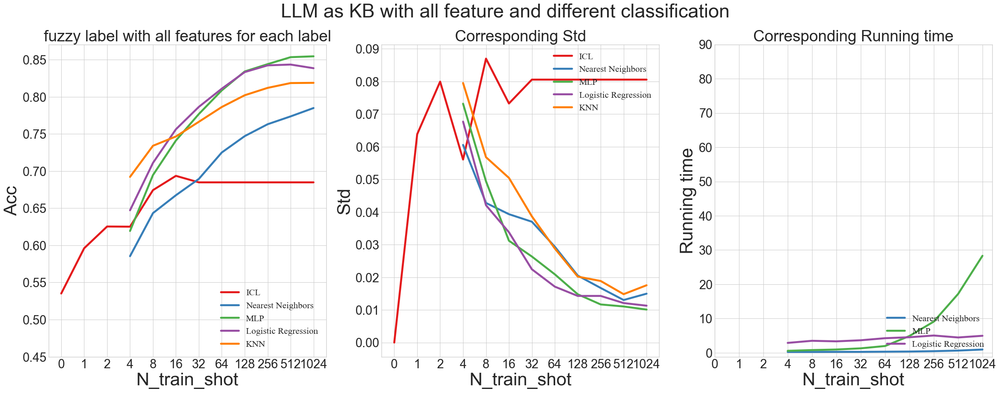

In [6]:
MODEL='gpt2-xl'
DATASETS = ['sst2', 'subj', 'mpqa', 'agnews', 'cb', 'cr', 'dbpedia', 'mr', 'rte', 'trec']
MAX_ICL_SHOTS = [16, 8, 32, 2, 2, 8, 1, 8, 4, 8]
all_shots = [0, 1, 2, 4, 8, 16, 32, 64, 128, 256, 512, 1024]
fuzzy_label_shots = [4, 8, 16, 32, 64, 128, 256, 512, 1024]
# KB results
result = f'../output/hs_as_feature/{MODEL}/results_hs_as_feature.csv'
result_dfs = pd.read_csv(result)


avg_dicts = []
std_dicts = []
avg_running_time = []
for dataset in DATASETS:
    df = result_dfs[result_dfs['dataset']==dataset]
    method_set = df['method'].unique().tolist()
    n_train_shot_set = df['n_train_shot'].unique().tolist()
    seed_set = df['seed'].unique().tolist()

    assert n_train_shot_set == fuzzy_label_shots

    avg_dict = {}
    std_dict = {}
    running_time_dict = {}
    for method in method_set:
        avg_dict[method] = []
        std_dict[method] = []
        running_time_dict[method] = []
        for n_train_shot in n_train_shot_set:
            choosed_acc = df[(df['method'] == method) & (df['n_train_shot'] == n_train_shot)]['acc']
            avg_dict[method].append(choosed_acc.mean())
            std_dict[method].append(choosed_acc.std())
            choosed_running_time = df[(df['method'] == method) & (df['n_train_shot'] == n_train_shot)]['running_time']
            running_time_dict[method].append(choosed_running_time.mean())
    avg_dicts.append(avg_dict)
    std_dicts.append(std_dict)
    avg_running_time.append(running_time_dict)

# icl results
icl_results = [f'../output/icl/results_icl_{dataset}.csv' for dataset in DATASETS]
icl_dfs = [pd.read_csv(icl_result) for icl_result in icl_results]

icl_avgs = []
icl_stds = []
for index, icl_df in enumerate(icl_dfs):
    icl_n_train_shot_set = icl_df['n_train_shot'].unique().tolist()

    assert icl_n_train_shot_set == all_shots[:len(icl_n_train_shot_set)]

    icl_avg = []
    icl_std = []
    for n_train_shot in icl_n_train_shot_set:
        choosed_acc = icl_df[icl_df['n_train_shot'] == n_train_shot]['acc']
        icl_avg.append(choosed_acc.mean())
        icl_std.append(choosed_acc.std())

    # adjust icl result
    remain_num = len(icl_n_train_shot_set)
    icl_avg = icl_avg + [icl_avg[- 1]]*(len(all_shots) - remain_num)
    icl_std = icl_std + [icl_std[- 1]]*(len(all_shots) - remain_num)
    icl_avgs.append(icl_avg)
    icl_stds.append(icl_std)

# KNN results
knn_results = '../output/results_knnprompting.csv'
knn_dfs = pd.read_csv(knn_results)

knn_avgs = []
knn_stds = []
for index, dataset in enumerate(DATASETS):
    knn_df = knn_dfs[knn_dfs['dataset'] == dataset]

    knn_avg = []
    knn_std = []
    for n_train_shot in knn_train_shots:
        choosed_acc = knn_df[knn_df['n_train_shot'] == n_train_shot]['acc']
        knn_avg.append(choosed_acc.mean())
        knn_std.append(choosed_acc.std())

    knn_avgs.append(knn_avg)
    knn_stds.append(knn_std)

plt.style.use('seaborn-whitegrid')
palette = plt.get_cmap('Set1')
font1 = {'family' : 'Times New Roman',
'weight' : 'normal',
'size'   : 16,
}

fig=plt.figure(figsize=(30,10))

def avg_on_dataset(metrics_list):
    return np.array(metrics_list).mean(axis=0)
avg_dict = {method: avg_on_dataset([_avgdict[method] for _avgdict in avg_dicts]) for method in method_set}
std_dict = {method: avg_on_dataset([_stddict[method] for _stddict in std_dicts]) for method in method_set}
running_time_dict = {method: avg_on_dataset([_timedict[method] for _timedict in avg_running_time]) for method in method_set}
icl_avg = avg_on_dataset(icl_avgs)
icl_std = avg_on_dataset(icl_stds)
def draw_line(name_of_alg, color_index, avg, is_icl=False):
    if not is_icl:
        choosed_shots = fuzzy_label_shots
    else:
        choosed_shots = all_shots
    color=palette(color_index)
    plt.plot([all_shots.index(_shot) for _shot in choosed_shots], avg, color=color,label=name_of_alg,linewidth=3.5)

plt.subplot(1, 3, 1)
draw_line('ICL',0, icl_avg, is_icl=True)
for i, method in enumerate(method_set, start=1):
    draw_line(method,i, avg_dict[method])

knn_avg = avg_on_dataset(knn_avgs)
knn_std = avg_on_dataset(knn_stds)
color=palette(len(method_set) + 1)
plt.plot([all_shots.index(_shot) for _shot in knn_train_shots], knn_avg, color=color,label='KNN',linewidth=3.5)

plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
plt.yticks(np.arange(start=0.45, stop=0.9,step=0.05), fontsize=22)
plt.xlabel('N_train_shot',fontsize=32)
plt.ylabel('Acc',fontsize=32)
plt.legend(loc='lower right',prop=font1)
plt.title(f"fuzzy label with all features for each label", fontsize=28)

plt.subplot(1, 3, 2)
draw_line('ICL',0, icl_std, is_icl=True)
for i, method in enumerate(method_set, start=1):
    draw_line(method,i, std_dict[method])
color=palette(len(method_set) + 1)
plt.plot([all_shots.index(_shot) for _shot in knn_train_shots], knn_std, color=color,label='KNN',linewidth=3.5)

plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
plt.yticks(np.arange(start=0, stop=0.1,step=0.01), fontsize=22)
plt.xlabel('N_train_shot',fontsize=32)
plt.ylabel('Std',fontsize=32)
plt.legend(loc='upper right',prop=font1)
plt.title(f"Corresponding Std", fontsize=28)

plt.subplot(1, 3, 3)
for i, method in enumerate(method_set, start=1):
    draw_line(method,i, running_time_dict[method])

plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
plt.yticks(np.arange(start=0, stop=100,step=10), fontsize=22)
plt.xlabel('N_train_shot',fontsize=32)
plt.ylabel('Running time',fontsize=32)
plt.legend(loc='lower right',prop=font1)
plt.title(f"Corresponding Running time", fontsize=28)

plt.suptitle("LLM as KB with all feature and different classification",fontsize=34)
plt.show()

### hs as feature with demo

C:\Users\USER\AppData\Local\Temp\ipykernel_17584\235206774.py:102: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


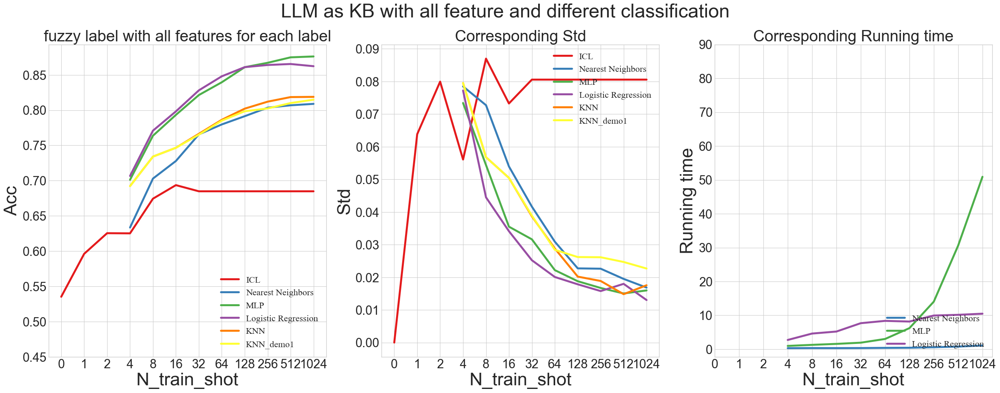

In [9]:
MODEL='gpt2-xl'
DATASETS = ['sst2', 'subj', 'mpqa', 'agnews', 'cb', 'cr', 'dbpedia', 'mr', 'rte', 'trec']
MAX_ICL_SHOTS = [16, 8, 32, 2, 2, 8, 1, 8, 4, 8]
all_shots = [0, 1, 2, 4, 8, 16, 32, 64, 128, 256, 512, 1024]
fuzzy_label_shots = [4, 8, 16, 32, 64, 128, 256, 512, 1024]
# KB results
result = f'../output/hs_as_feature_with_demo/{MODEL}/results_hs_as_feature.csv'
result_dfs = pd.read_csv(result)


avg_dicts = []
std_dicts = []
avg_running_time = []
for dataset in DATASETS:
    df = result_dfs[result_dfs['dataset']==dataset]
    method_set = df['method'].unique().tolist()
    n_train_shot_set = df['n_train_shot'].unique().tolist()
    seed_set = df['seed'].unique().tolist()

    assert n_train_shot_set == fuzzy_label_shots

    avg_dict = {}
    std_dict = {}
    running_time_dict = {}
    for method in method_set:
        avg_dict[method] = []
        std_dict[method] = []
        running_time_dict[method] = []
        for n_train_shot in n_train_shot_set:
            choosed_acc = df[(df['method'] == method) & (df['n_train_shot'] == n_train_shot)]['acc']
            avg_dict[method].append(choosed_acc.mean())
            std_dict[method].append(choosed_acc.std())
            choosed_running_time = df[(df['method'] == method) & (df['n_train_shot'] == n_train_shot)]['running_time']
            running_time_dict[method].append(choosed_running_time.mean())
    avg_dicts.append(avg_dict)
    std_dicts.append(std_dict)
    avg_running_time.append(running_time_dict)

# icl results
icl_results = [f'../output/icl/results_icl_{dataset}.csv' for dataset in DATASETS]
icl_dfs = [pd.read_csv(icl_result) for icl_result in icl_results]

icl_avgs = []
icl_stds = []
for index, icl_df in enumerate(icl_dfs):
    icl_n_train_shot_set = icl_df['n_train_shot'].unique().tolist()

    assert icl_n_train_shot_set == all_shots[:len(icl_n_train_shot_set)]

    icl_avg = []
    icl_std = []
    for n_train_shot in icl_n_train_shot_set:
        choosed_acc = icl_df[icl_df['n_train_shot'] == n_train_shot]['acc']
        icl_avg.append(choosed_acc.mean())
        icl_std.append(choosed_acc.std())

    # adjust icl result
    remain_num = len(icl_n_train_shot_set)
    icl_avg = icl_avg + [icl_avg[- 1]]*(len(all_shots) - remain_num)
    icl_std = icl_std + [icl_std[- 1]]*(len(all_shots) - remain_num)
    icl_avgs.append(icl_avg)
    icl_stds.append(icl_std)

# KNN results
knn_results = '../output/results_knnprompting.csv'
knn_dfs = pd.read_csv(knn_results)

knn_avgs = []
knn_stds = []
for index, dataset in enumerate(DATASETS):
    knn_df = knn_dfs[knn_dfs['dataset'] == dataset]

    knn_avg = []
    knn_std = []
    for n_train_shot in knn_train_shots:
        choosed_acc = knn_df[knn_df['n_train_shot'] == n_train_shot]['acc']
        knn_avg.append(choosed_acc.mean())
        knn_std.append(choosed_acc.std())

    knn_avgs.append(knn_avg)
    knn_stds.append(knn_std)

# KNN-demo1 results
knn_demo1_results = '../output/knn_demo1/results_knnprompting.csv'
knn_demo1_dfs = pd.read_csv(knn_demo1_results)

knn_demo1_avgs = []
knn_demo1_stds = []
for index, dataset in enumerate(DATASETS):
    knn_demo1_df = knn_demo1_dfs[knn_demo1_dfs['dataset'] == dataset]

    knn_avg = []
    knn_std = []
    for n_train_shot in fuzzy_label_shots:
        choosed_acc = knn_demo1_df[knn_demo1_df['n_train_shot'] == n_train_shot]['acc']
        knn_avg.append(choosed_acc.mean())
        knn_std.append(choosed_acc.std())

    knn_demo1_avgs.append(knn_avg)
    knn_demo1_stds.append(knn_std)

plt.style.use('seaborn-whitegrid')
palette = plt.get_cmap('Set1')
font1 = {'family' : 'Times New Roman',
'weight' : 'normal',
'size'   : 16,
}

fig=plt.figure(figsize=(30,10))

def avg_on_dataset(metrics_list):
    return np.array(metrics_list).mean(axis=0)
avg_dict = {method: avg_on_dataset([_avgdict[method] for _avgdict in avg_dicts]) for method in method_set}
std_dict = {method: avg_on_dataset([_stddict[method] for _stddict in std_dicts]) for method in method_set}
running_time_dict = {method: avg_on_dataset([_timedict[method] for _timedict in avg_running_time]) for method in method_set}
icl_avg = avg_on_dataset(icl_avgs)
icl_std = avg_on_dataset(icl_stds)
def draw_line(name_of_alg, color_index, avg, is_icl=False):
    if not is_icl:
        choosed_shots = fuzzy_label_shots
    else:
        choosed_shots = all_shots
    color=palette(color_index)
    plt.plot([all_shots.index(_shot) for _shot in choosed_shots], avg, color=color,label=name_of_alg,linewidth=3.5)

plt.subplot(1, 3, 1)
draw_line('ICL',0, icl_avg, is_icl=True)
for i, method in enumerate(method_set, start=1):
    draw_line(method,i, avg_dict[method])

knn_avg = avg_on_dataset(knn_avgs)
knn_std = avg_on_dataset(knn_stds)
color=palette(len(method_set) + 1)
plt.plot([all_shots.index(_shot) for _shot in knn_train_shots], knn_avg, color=color,label='KNN',linewidth=3.5)

knn_demo1_avg = avg_on_dataset(knn_demo1_avgs)
knn_demo1_std = avg_on_dataset(knn_demo1_stds)
color=palette(len(method_set) + 2)
plt.plot([all_shots.index(_shot) for _shot in knn_train_shots], knn_demo1_avg, color=color,label='KNN_demo1',linewidth=3.5)

plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
plt.yticks(np.arange(start=0.45, stop=0.9,step=0.05), fontsize=22)
plt.xlabel('N_train_shot',fontsize=32)
plt.ylabel('Acc',fontsize=32)
plt.legend(loc='lower right',prop=font1)
plt.title(f"fuzzy label with all features for each label", fontsize=28)

plt.subplot(1, 3, 2)
draw_line('ICL',0, icl_std, is_icl=True)
for i, method in enumerate(method_set, start=1):
    draw_line(method,i, std_dict[method])
color=palette(len(method_set) + 1)
plt.plot([all_shots.index(_shot) for _shot in knn_train_shots], knn_std, color=color,label='KNN',linewidth=3.5)

color=palette(len(method_set) + 2)
plt.plot([all_shots.index(_shot) for _shot in knn_train_shots], knn_demo1_std, color=color,label='KNN_demo1',linewidth=3.5)

plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
plt.yticks(np.arange(start=0, stop=0.1,step=0.01), fontsize=22)
plt.xlabel('N_train_shot',fontsize=32)
plt.ylabel('Std',fontsize=32)
plt.legend(loc='upper right',prop=font1)
plt.title(f"Corresponding Std", fontsize=28)

plt.subplot(1, 3, 3)
for i, method in enumerate(method_set, start=1):
    draw_line(method,i, running_time_dict[method])

plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
plt.yticks(np.arange(start=0, stop=100,step=10), fontsize=22)
plt.xlabel('N_train_shot',fontsize=32)
plt.ylabel('Running time',fontsize=32)
plt.legend(loc='lower right',prop=font1)
plt.title(f"Corresponding Running time", fontsize=28)

plt.suptitle("LLM as KB with all feature and different classification",fontsize=34)
plt.show()

### fuzzy label for llama7B

In [ ]:
MODEL='llama-7B'
DATASETS = ['sst2', 'subj', 'mpqa', 'agnews', 'cb', 'cr', 'dbpedia', 'mr', 'rte', 'trec']
MAX_ICL_SHOTS = [16, 8, 32, 2, 2, 8, 1, 8, 4, 8]
all_shots = [0, 1, 2, 4, 8, 16, 32, 64, 128, 256, 512, 1024]
fuzzy_label_shots = [4, 8, 16, 32, 64, 128, 256, 512, 1024]
FUZZY_K = [1, 10,100,1000]
# KB results
avg_dicts_across_k = {}
std_dicts_across_k = {}
avg_running_time_across_k = {}
for k in FUZZY_K:
    # if k == 1 :
    #     results = [f'../output/only_label/results_KB_only_label_feature_{dataset}.csv' for dataset in DATASETS]
    # else:
    #     results = [f'../output/fuzzy_label/results_KB_fuzzy_label_{k}_feature_{dataset}.csv' for dataset in DATASETS]
    results = [f'../output/fuzzy_label/{MODEL}/results_KB_fuzzy_label_{k}_feature_{dataset}.csv' for dataset in DATASETS]
    result_dfs = [pd.read_csv(result) for result in results]


    avg_dicts = []
    std_dicts = []
    avg_running_time = []
    # 遍历所有数据集
    for df in result_dfs:
        method_set = df['method'].unique().tolist()
        n_train_shot_set = df['n_train_shot'].unique().tolist()
        seed_set = df['seed'].unique().tolist()

        assert n_train_shot_set == fuzzy_label_shots, (n_train_shot_set, fuzzy_label_shots)

        avg_dict = {}
        std_dict = {}
        running_time_dict = {}
        for method in method_set:
            avg_dict[method] = []
            std_dict[method] = []
            running_time_dict[method] = []
            for n_train_shot in n_train_shot_set:
                choosed_acc = df[(df['method'] == method) & (df['n_train_shot'] == n_train_shot)]['acc']
                assert len(choosed_acc) == len(seed_set), (len(choosed_acc), len(seed_set))
                avg_dict[method].append(choosed_acc.mean())
                std_dict[method].append(choosed_acc.std())
                choosed_running_time = df[(df['method'] == method) & (df['n_train_shot'] == n_train_shot)]['running_time']
                running_time_dict[method].append(choosed_running_time.mean())
        avg_dicts.append(avg_dict)
        std_dicts.append(std_dict)
        avg_running_time.append(running_time_dict)
    avg_dicts_across_k[k] = avg_dicts
    std_dicts_across_k[k] = std_dicts
    avg_running_time_across_k[k] = avg_running_time


# icl results
icl_results = [f'../output/icl/results_icl_{dataset}.csv' for dataset in DATASETS]
icl_dfs = [pd.read_csv(icl_result) for icl_result in icl_results]

icl_avgs = []
icl_stds = []
for index, icl_df in enumerate(icl_dfs):
    icl_n_train_shot_set = icl_df['n_train_shot'].unique().tolist()

    assert icl_n_train_shot_set == all_shots[:len(icl_n_train_shot_set)]

    icl_avg = []
    icl_std = []
    for n_train_shot in icl_n_train_shot_set:
        choosed_acc = icl_df[icl_df['n_train_shot'] == n_train_shot]['acc']
        icl_avg.append(choosed_acc.mean())
        icl_std.append(choosed_acc.std())

    # adjust icl result
    remain_num = len(icl_n_train_shot_set)
    icl_avg = icl_avg + [icl_avg[- 1]]*(len(all_shots) - remain_num)
    icl_std = icl_std + [icl_std[- 1]]*(len(all_shots) - remain_num)
    icl_avgs.append(icl_avg)
    icl_stds.append(icl_std)



plt.style.use('seaborn-whitegrid')
palette = plt.get_cmap('Set1')
font1 = {'family' : 'Times New Roman',
'weight' : 'normal',
'size'   : 16,
}

fig=plt.figure(figsize=(30,40))

for index, k in enumerate(FUZZY_K):
    plt.subplot(4, 3, 3*index + 1)

    def avg_on_dataset(metrics_list):
        return np.array(metrics_list).mean(axis=0)
    avg_dicts = avg_dicts_across_k[k]
    std_dicts = std_dicts_across_k[k]
    avg_running_time = avg_running_time_across_k[k]
    avg_dict = {method: avg_on_dataset([_avgdict[method] for _avgdict in avg_dicts]) for method in method_set}
    std_dict = {method: avg_on_dataset([_stddict[method] for _stddict in std_dicts]) for method in method_set}
    running_time_dict = {method: avg_on_dataset([_timedict[method] for _timedict in avg_running_time]) for method in method_set}

    icl_avg = avg_on_dataset(icl_avgs)
    icl_std = avg_on_dataset(icl_stds)
    def draw_line(name_of_alg, color_index, avg, is_icl=False):
        if not is_icl:
            choosed_shots = fuzzy_label_shots
        else:
            choosed_shots = all_shots
        color=palette(color_index)
        plt.plot([all_shots.index(_shot) for _shot in choosed_shots], avg, color=color,label=name_of_alg,linewidth=3.5)

    draw_line('ICL',0, icl_avg, is_icl=True)
    for i, method in enumerate(method_set, start=1):
        draw_line(method,i, avg_dict[method])

    plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
    plt.yticks(np.arange(start=0.45, stop=0.9,step=0.05), fontsize=22)
    plt.xlabel('N_train_shot',fontsize=32)
    plt.ylabel('Acc',fontsize=32)
    plt.legend(loc='lower right',prop=font1)
    plt.title(f"fuzzy label with {k} features for each label", fontsize=28)


    plt.subplot(4, 3, 3*index + 2)
    draw_line('ICL',0, icl_std, is_icl=True)
    for i, method in enumerate(method_set, start=1):
        draw_line(method,i, std_dict[method])

    plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
    plt.yticks(np.arange(start=0, stop=0.1,step=0.01), fontsize=22)
    plt.xlabel('N_train_shot',fontsize=32)
    plt.ylabel('Std',fontsize=32)
    plt.legend(loc='upper right',prop=font1)
    plt.title(f"Corresponding Std", fontsize=28)

    plt.subplot(4, 3, 3*index + 3)
    for i, method in enumerate(method_set, start=1):
        draw_line(method,i, running_time_dict[method])

    plt.xticks(range(len(all_shots)), labels=all_shots,fontsize=22)
    plt.yticks(np.arange(start=0, stop=100,step=10), fontsize=22)
    plt.xlabel('N_train_shot',fontsize=32)
    plt.ylabel('Running time',fontsize=32)
    plt.legend(loc='lower right',prop=font1)
    plt.title(f"Corresponding Running time", fontsize=28)
plt.suptitle("LLM as KB with fuzzy label feature and different classification",fontsize=34)
plt.show()

###